In [110]:
from utils import *

# to connect plotly with pandas
import cufflinks as cf  
import plotly           # to plot interactive visualizations
import chart_studio.plotly as py  #more charting options 
import plotly.express as px
#import matplotlib.pyplot as plt
%matplotlib inline


#to run plotly offline
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot   
init_notebook_mode(connected=True)
cf.go_offline()

import altair as alt

In [111]:
#%store -r df_alldata
#%store -r bayes_df
#%store -r bayes_adj

In [112]:
bayes_df = pd.read_csv('data/movie_aggregate.csv')

## Movie budgets, revenues and profits have generally been on on upward trend.
### Note that in 2020 all financials dipped as the movie industry came to a halt

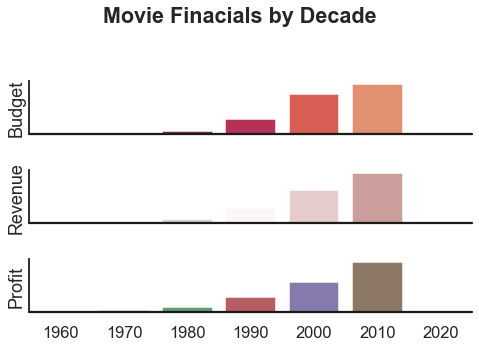

In [19]:
plotFinancials(bayes_df)


In [97]:
## Data for Oscar Nods
onods_df = bayes_df.copy()
onods_df['nods'] = onods_df['Wins'] + onods_df['Nominations']
onods_df1=onods_df.groupby('Decade').agg(['sum']).reset_index()
list(onods_df1['nods'].T.values)
#onods_df.Decade
nods = pd.DataFrame(list(onods_df1['nods'].T.values),index=list(onods_df1.Decade))

nods

,0,1,2,3,4,5,6
1960,219,287,341,528,655,790,0
1970,219,287,341,528,655,790,0
1980,219,287,341,528,655,790,0
1990,219,287,341,528,655,790,0
2000,219,287,341,528,655,790,0
2010,219,287,341,528,655,790,0
2020,219,287,341,528,655,790,0


In [105]:
nod_df2= onods_df[['Decade','Wins','Nominations']]
nod_df2.to_csv(r'data/nods.csv')


[1960, 1970, 1980, 1990, 2000, 2010, 2020]

In [67]:
source = bayes_df

alt.Chart(source,title="Count of Movies by Critics Scores").mark_bar().encode(
    x='count(Titles):Q',
    y=alt.Y('Critics_Choice:N', sort='-x',axis=alt.Axis(title='Good [ 1 ]   vs.   Not Good [ 0 ] ')),
    color = ('Critics_Choice:N')
                                           
).properties(
    width=800,
    height=300)

alt.Chart(...)

In [60]:
source = bayes_df

alt.Chart(source,title="Count of Movies by User Scores").mark_bar().encode(
    x='count(Titles):Q',
    y=alt.Y('Users_Pick:N', sort='-x',axis=alt.Axis(title='Good [ 1 ]   vs.   Not Good [ 0 ] ')),
    color=alt.Color('Users_Pick', legend=None)
).properties(
    width=800,
    height=300)

alt.Chart(...)

In [21]:
source = bayes_df

alt.Chart(source).mark_bar().encode(
    x='count(Titles):Q',
    y=alt.Y('Users_Pick:N', sort='-x',axis=alt.Axis(title='Good vs. Bad Based on User Scores')),
    color = ('Users_Pick:O')
).properties(
    width=800,
    height=300)

chart.save('images/GoodvBad.png', scale_factor=2.0)

NameError: name 'chart' is not defined

In [428]:
chart_decade2010 = bayes_df.copy()
#chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='count(Titles):Q',
    y='Critics_Choice:O',
    color='Critics_Choice:N',
    row='Profitable:N'
).properties(
    width=800,
    height=200)
#plt.savefig('images/GoodvBad.png', dpi=300)

alt.Chart(...)

In [12]:
chart_decade2010 = bayes_df.copy()
#chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='count(Users_Pick):Q',
    y='Users_Pick:N',
    color='Users_Pick:N',
    row='Profitable:N'
).properties(
    width=800,
    height=200)
plt.savefig('images/Profitability_by_quality.png', dpi=300)

<Figure size 432x288 with 0 Axes>

In [389]:
bayes_df.columns

Index(['Title', 'Critics_Score', 'User_Score', 'Budget', 'Revenue', 'Profit',
       'ROI', 'Profitable', 'Critics_Choice', 'Users_Pick', 'Award_Status',
       'Wins', 'Nominations', 'Genres', 'Year', 'Decade', 'Runtime'],
      dtype='object')

In [143]:
decade2010 = bayes_df[bayes_df['Decade']==2010].sort_values(by='Critics_Score',ascending=False)

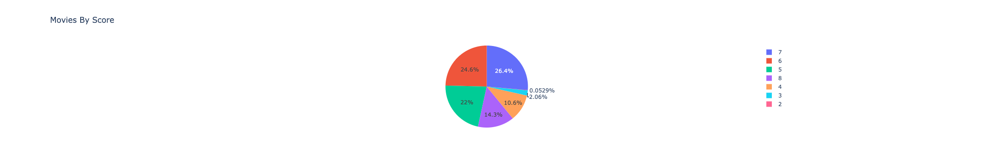

<Figure size 432x288 with 0 Axes>

In [144]:
#df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
df = decade2010.copy()
df = df.sort_values(by='Critics_Score', ascending=False)
df['User_Score']=df['User_Score']//1
#df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
fig = px.pie(df, values='User_Score', names='User_Score', title='Movies By Score')
#fig = px.pie(df, values='Good', names='Good', title='Movies By Score')
plt.tight_layout(h_pad=2)
fig.show()
plt.savefig('images/agg_score_users.png')

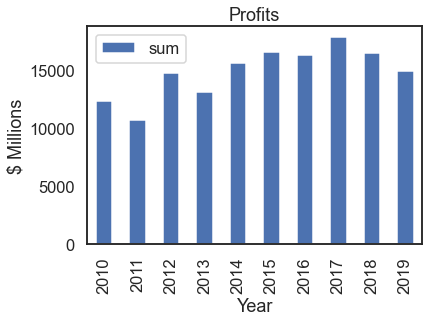

In [146]:
df_daily=decade2010.groupby('Year').agg(['sum']).reset_index()
df_daily.plot(x='Year', y='Profit',kind="bar")
plt.xlabel("Year")
plt.title("Profits")
plt.ylabel("$ Millions")
plt.legend()
plt.show()

In [151]:
chart_decade2010=decade2010.copy()
chart_decade2010.columns


Index(['Title', 'Critics_Score', 'User_Score', 'Budget', 'Revenue', 'Profit',
       'ROI', 'Profitable', 'Critics_Choice', 'Users_Pick', 'Award_Status',
       'Wins', 'Nominations', 'Genres', 'Year', 'Decade', 'Runtime'],
      dtype='object')

In [158]:
import altair as alt
#from vega_datasets import data
chart_decade2010=decade2010.copy()
chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='mean(Profit):Q',
    y='Year:O',
    color='Year:N',
    row='Critics_Choice:N'
)

alt.Chart(...)

In [159]:
import altair as alt
#from vega_datasets import data
chart_decade2010=decade2010.copy()
chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
chart_decade2010['Users_Pick']=chart_decade2010['Users_Pick']//1
chart_decade2010['Award_Status']=chart_decade2010['Award_Status']//1

source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='mean(ROI):Q',
    y='Year:O',
    color='Year:N',
    row='Critics_Choice:N'
)

alt.Chart(...)

In [160]:
import altair as alt
#from vega_datasets import data
chart_decade2010=decade2010.copy()
chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
chart_decade2010['Users_Pick']=chart_decade2010['Users_Pick']//1
chart_decade2010['Award_Status']=chart_decade2010['Award_Status']//1

source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='mean(ROI):Q',
    y='Year:O',
    color='Year:N',
    row='Users_Pick:N'
)

alt.Chart(...)

In [162]:
import altair as alt
#from vega_datasets import data
chart_decade2010=decade2010.copy()
chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
chart_decade2010['Users_Pick']=chart_decade2010['Users_Pick']//1
chart_decade2010['Award_Status']=chart_decade2010['Award_Status']//1

source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='mean(ROI):Q',
    y='Users_Pick:N',
    color='Users_Pick:N',
    row='Year:N'
)

alt.Chart(...)

In [166]:
import altair as alt
#from vega_datasets import data
chart_decade2010=decade2010.copy()
chart_decade2010['Critics_Choice']=chart_decade2010['Critics_Choice']//1
chart_decade2010['Users_Pick']=chart_decade2010['Users_Pick']//1
chart_decade2010['Award_Status']=chart_decade2010['Award_Status']//1

source = chart_decade2010

alt.Chart(source).mark_bar().encode(
    x='sum(Profit):Q',
    y='Critics_Choice:N',
    color='Critics_Choice:N',
    row='Year:N'
)

alt.Chart(...)

In [175]:
import altair as alt
chart_decade2010=decade2010.copy()
chart_decade2010['Critics_Score']=chart_decade2010['Critics_Score']//1
chart_decade2010['User_Score']=chart_decade2010['User_Score']//1
chart_decade2010['Award_Status']=chart_decade2010['Award_Status']//1

source = chart_decade2010

bars = alt.Chart().mark_bar().encode(
    x='Critics_Choice:O',
    y=alt.Y('sum(Profit):Q', title='Profits'),
    color='Critics_Choice:N',
)

error_bars = alt.Chart().mark_errorbar(extent='ci').encode(
    x='Critics_Choice:O',
    y='Profit:Q'
)

alt.layer(bars, error_bars, data=source).facet(
    column='Critics_Score:N'
)

alt.FacetChart(...)

In [68]:
import altair as alt
chart_all=bayes_df.copy()

chart_all['Critics_Score']=chart_all['Critics_Score']//1
chart_all['User_Score']=chart_all['User_Score']//1
chart_all['Award_Status']=chart_all['Award_Status']//1

source = chart_all

base = alt.Chart(source,title="Movie Budgets and Revenues from 1960-2020").encode(x='Year:O')

bar = base.mark_bar().encode(y='sum(Revenue):Q')

line =  base.mark_line(color='red').encode(
    y='sum(Budget):Q'
)

(bar + line).properties(width=800,height=400)

alt.LayerChart(...)

In [199]:
import altair as alt
chart_all=bayes_df.copy()

chart_all['Critics_Score']=chart_all['Critics_Score']//1
chart_all['User_Score']=chart_all['User_Score']//1
chart_all['Award_Status']=chart_all['Award_Status']//1

source = chart_all

base = alt.Chart(source).encode(x='Decade:O')

bar = base.mark_bar().encode(y='sum(User_Score):Q')

line =  base.mark_line(color='red').encode(
    y='sum(Profitable):Q'
)

(bar + line).properties(width=800,height=400)

alt.LayerChart(...)

In [ ]:
import altair as alt
from vega_datasets import data


chart_all=bayes_df.copy()

chart_all['Critics_Score']=chart_all['Critics_Score']//1
chart_all['User_Score']=chart_all['User_Score']//1
chart_all['Award_Status']=chart_all['Award_Status']//1

source = chart_all


brush = alt.selection(type='interval', encodings=['x'])

# Define the base chart, with the common parts of the
# background and highlights
base = alt.Chart().mark_bar().encode(
    x=alt.X(alt.repeat('column'), type='quantitative', bin=alt.Bin(maxbins=20)),
    y='count()'
).properties(
    width=160,
    height=130
)

# gray background with selection
background = base.encode(
    color=alt.value('#ddd')
).add_selection(brush)

# blue highlights on the transformed data
highlight = base.transform_filter(brush)

# layer the two charts & repeat
alt.layer(
    background,
    highlight,
    data=source
).transform_calculate(
    "time",
    "hours(datum.date)"
).repeat(column=["distance", "delay", "time"])

In [201]:
import altair as alt
from vega_datasets import data

source = alt.UrlData(
    data.flights_2k.url,
    format={'parse': {'date': 'date'}}
)

brush = alt.selection(type='interval', encodings=['x'])

# Define the base chart, with the common parts of the
# background and highlights
base = alt.Chart().mark_bar().encode(
    x=alt.X(alt.repeat('column'), type='quantitative', bin=alt.Bin(maxbins=20)),
    y='count()'
).properties(
    width=160,
    height=130
)

# gray background with selection
background = base.encode(
    color=alt.value('#ddd')
).add_selection(brush)

# blue highlights on the transformed data
highlight = base.transform_filter(brush)

# layer the two charts & repeat
alt.layer(
    background,
    highlight,
    data=source
).transform_calculate(
    "time",
    "hours(datum.date)"
).repeat(column=["distance", "delay", "time"])

alt.RepeatChart(...)

In [222]:
import altair as alt

chart_all=bayes_df.copy()

chart_all['Critics_Score']=chart_all['Critics_Score']//1
chart_all['User_Score']=chart_all['User_Score']//1
chart_all['Award_Status']=chart_all['Award_Status']//1

source = chart_all


alt.Chart(source,title='Difference in Revenue Between Good and Not Good Movies').mark_line().encode(
    alt.X('Year:O'),
    alt.Y('sum(Profit):Q', axis=alt.Axis(format='%')),
    color='Critics_Score:N')
#).transform_filter(
#    alt.datum. == 'Welder'
#)

alt.Chart(...)

In [202]:
import altair as alt
from vega_datasets import data

source = data.jobs.url

alt.Chart(source).mark_line().encode(
    alt.X('year:O'),
    alt.Y('perc:Q', axis=alt.Axis(format='%')),
    color='sex:N'
).transform_filter(
    alt.datum.job == 'Welder'
)

UrlData({
  format: {'parse': {'date': 'date'}},
  url: 'https://cdn.jsdelivr.net/npm/vega-datasets@v1.29.0/data/flights-2k.json'
})

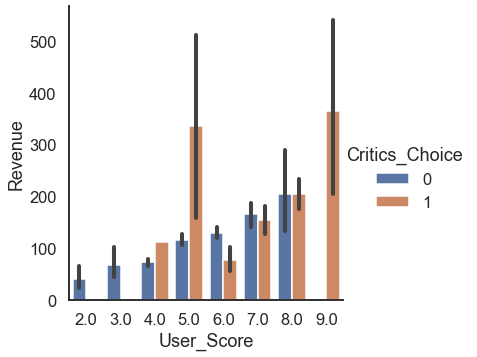

In [230]:
titanic = sns.load_dataset("titanic")

chart_all=bayes_df.copy()

chart_all['Critics_Score']=chart_all['Critics_Score']//1
chart_all['User_Score']=chart_all['User_Score']//1


source = chart_all


sns.catplot(x="User_Score", y="Revenue", hue="Critics_Choice", kind="bar", data=chart_all)

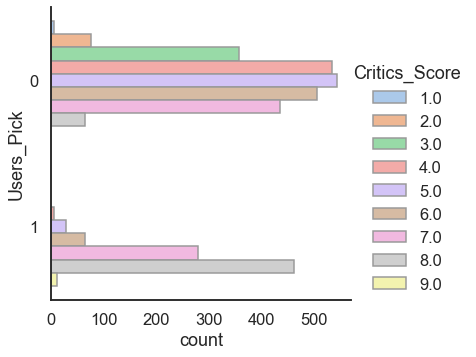

In [235]:
sns.catplot(y="Users_Pick", hue="Critics_Score", kind="count",
            palette="pastel", edgecolor=".6",
            data=chart_all)

In [204]:
dd

,date,delay,distance,origin,destination
0,2001-01-14 21:55:00,0,480,SAN,SMF
1,2001-03-26 20:15:00,-11,507,PHX,SLC
2,2001-03-05 14:55:00,-3,714,ELP,LAX
3,2001-01-07 12:30:00,12,342,SJC,SNA
4,2001-01-18 12:00:00,2,373,SMF,LAX
...,...,...,...,...,...
1995,2001-02-14 15:45:00,-10,217,DAL,IAH
1996,2001-03-02 20:30:00,3,239,DAL,HOU
1997,2001-02-12 06:20:00,-6,283,BDL,BWI
1998,2001-01-02 16:18:00,30,256,LAS,PHX


In [237]:
source

,Name,Miles_per_Gallon,Cylinders,Displacement,Horsepower,Weight_in_lbs,Acceleration,Year,Origin
0,chevrolet chevelle malibu,18.0,8,307.0,130.0,3504,12.0,1970-01-01,USA
1,buick skylark 320,15.0,8,350.0,165.0,3693,11.5,1970-01-01,USA
2,plymouth satellite,18.0,8,318.0,150.0,3436,11.0,1970-01-01,USA
3,amc rebel sst,16.0,8,304.0,150.0,3433,12.0,1970-01-01,USA
4,ford torino,17.0,8,302.0,140.0,3449,10.5,1970-01-01,USA
...,...,...,...,...,...,...,...,...,...
401,ford mustang gl,27.0,4,140.0,86.0,2790,15.6,1982-01-01,USA
402,vw pickup,44.0,4,97.0,52.0,2130,24.6,1982-01-01,Europe
403,dodge rampage,32.0,4,135.0,84.0,2295,11.6,1982-01-01,USA
404,ford ranger,28.0,4,120.0,79.0,2625,18.6,1982-01-01,USA


In [126]:
grouped_df=bayes_df.groupby('Year').agg(['sum']).reset_index()
#grouped_df.columns

In [127]:
import altair as alt
chart_all=bayes_df.copy()

chart_all['Critics_Score']=chart_all['Critics_Score']//1
chart_all['User_Score']=chart_all['User_Score']//1


source = chart_all

alt.Chart(source).mark_bar().encode(
    alt.X("Revenue:Q", bin=True),
    y='count()',
    row='Decade'
)

alt.Chart(...)

-----------------------
FIN

---------------------

In [5]:
#Get Genres from DF
genres_list = get_genres(bayes_df['Genres'])
genres_list

array(['action', 'adventure', 'animation', 'biography', 'comedy', 'crime',
       'drama', 'family', 'fantasy', 'history', 'horror', 'music',
       'musical', 'mystery', 'romance', 'sci-fi', 'sport', 'thriller',
       'war', 'western'], dtype='<U9')

In [19]:
bayes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3367 entries, 0 to 3366
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Title           3367 non-null   object 
 1   Critics_Score   3367 non-null   float64
 2   User_Score      3367 non-null   float64
 3   Budget          3367 non-null   int64  
 4   Revenue         3367 non-null   int64  
 5   Profit          3367 non-null   int64  
 6   ROI             3367 non-null   int64  
 7   Profitable      3367 non-null   int64  
 8   Critics_Choice  3367 non-null   int64  
 9   Users_Pick      3367 non-null   int64  
 10  Award_Status    3367 non-null   int64  
 11  Wins            3367 non-null   int64  
 12  Nominations     3367 non-null   int64  
 13  Genres          3367 non-null   object 
 14  Year            3367 non-null   int64  
 15  Decade          3367 non-null   int64  
 16  Runtime         3367 non-null   int64  
dtypes: float64(2), int64(13), object(

### Score distribution

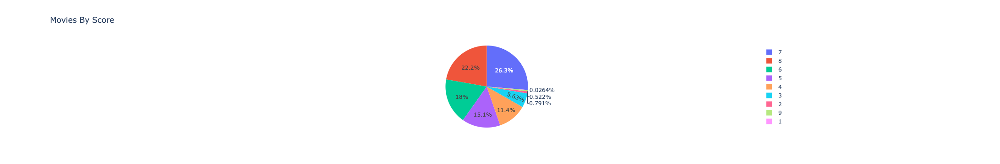

<Figure size 432x288 with 0 Axes>

In [7]:

import plotly.express as px
#df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
df = bayes_df.copy()
df = df.sort_values(by='Critics_Score', ascending=False)
df['Critics_Score']=df['Critics_Score']//1
#df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
fig = px.pie(df, values='Critics_Score', names='Critics_Score', title='Movies By Score')
#fig = px.pie(df, values='Good', names='Good', title='Movies By Score')
plt.tight_layout(h_pad=2)
fig.show()
plt.savefig('images/agg_score_critics.png')

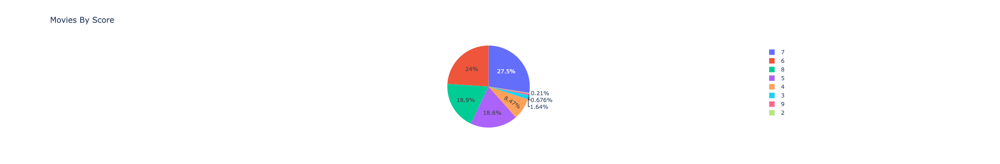

<Figure size 432x288 with 0 Axes>

In [8]:
#df = px.data.gapminder().query("year == 2007").query("continent == 'Europe'")
df = bayes_df.copy()
df = df.sort_values(by='Critics_Score', ascending=False)
df['User_Score']=df['User_Score']//1
#df.loc[df['pop'] < 2.e6, 'country'] = 'Other countries' # Represent only large countries
fig = px.pie(df, values='User_Score', names='User_Score', title='Movies By Score')
#fig = px.pie(df, values='Good', names='Good', title='Movies By Score')
plt.tight_layout(h_pad=2)
fig.show()
plt.savefig('images/agg_score_users.png')

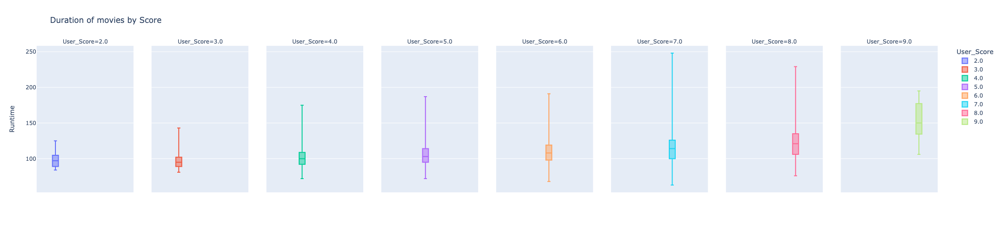

<Figure size 432x288 with 0 Axes>

In [9]:
fig = px.box(df.sort_values(by='User_Score',ascending=True), 
             y="Runtime", 
             title= 'Duration of movies by Score',
             facet_col = 'User_Score', 
             points = False,
             color = 'User_Score',
             height=500)
plt.tight_layout(h_pad=2)
fig.show()

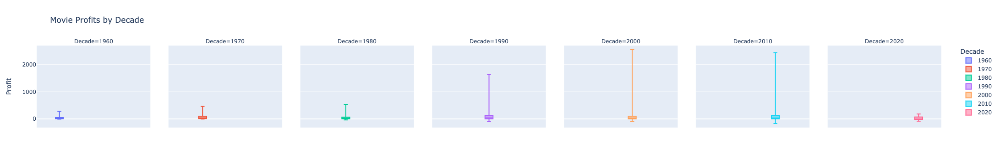

<Figure size 432x288 with 0 Axes>

In [10]:

fig = px.box(bayes_df.sort_values(by='Decade',ascending=True), 
             y="Profit", 
             title= 'Movie Profits by Decade',
             facet_col = 'Decade', 
             points = False,
             color = 'Decade')
plt.tight_layout(h_pad=2)
fig.show()

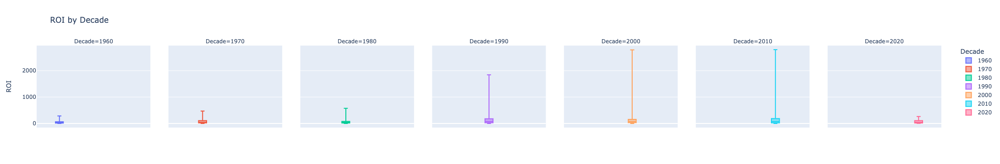

In [26]:
fig = px.box(bayes_df.sort_values(by='Decade',ascending=True), 
             y="ROI", 
             title= 'ROI by Decade',
             facet_col = 'Decade', 
             points = False,
             color = 'Decade')
fig.show()

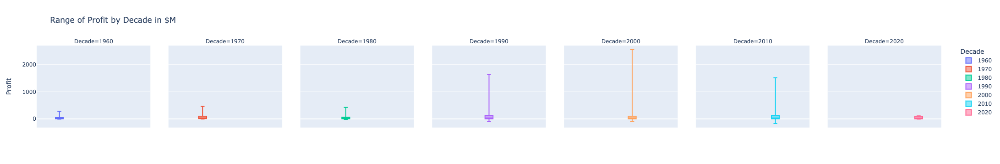

In [172]:
fig = px.box(bayes_df.sort_values(by='Decade',ascending=True), 
             y="Profit", 
             title= 'Profit by Decade in $M',
             facet_col = 'Decade', 
             points = False,
             color = 'Decade')
fig.show()

## Movies by Genre from 1960-2020

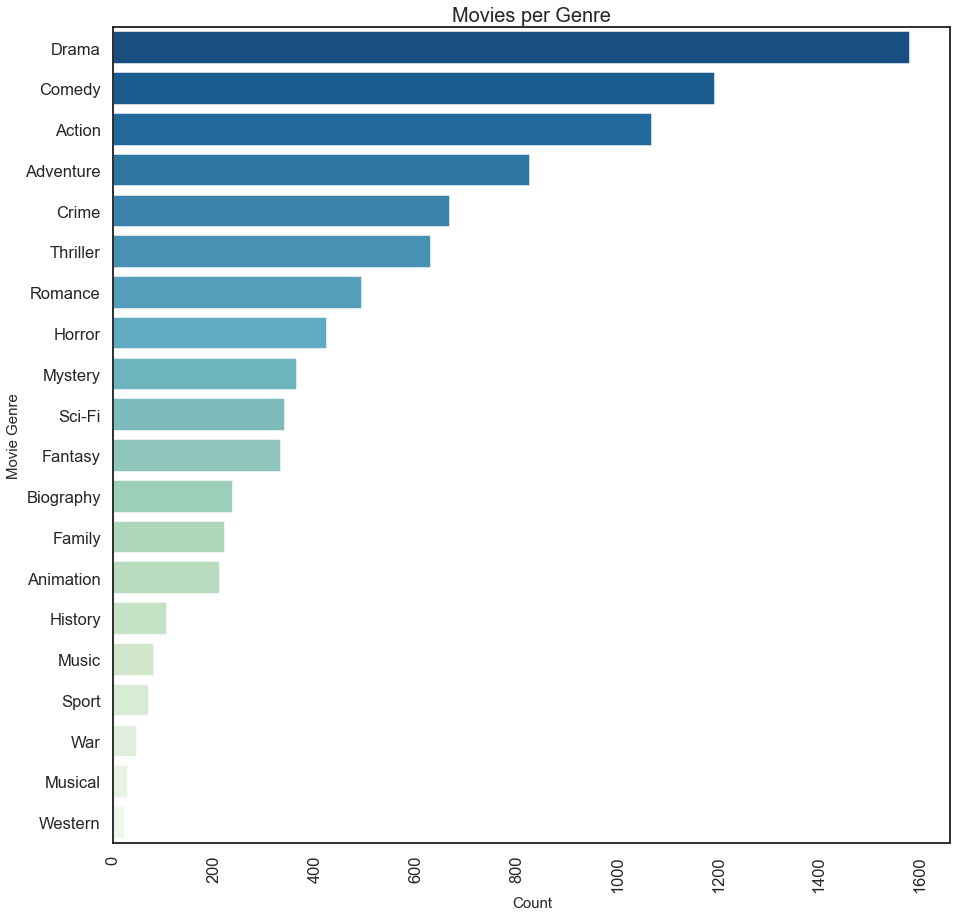

In [11]:
#Seaborn
#from collections import Counter
#df = bayes_df.Genres.copy()
plot_genres()



### Detailed genres by decade

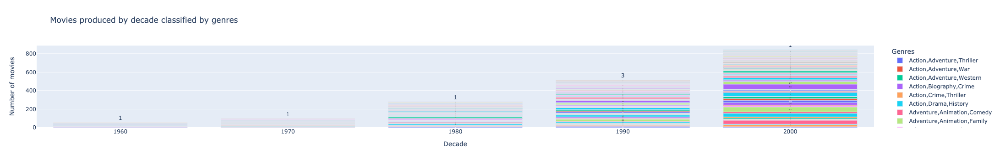

In [12]:
years_df =bayes_df[bayes_df['Decade']==2000]
years_df = years_df[['Year','Title', 'Genres']].groupby(['Year','Genres']).count().reset_index().rename(columns={'Title':'number_of_movies'})
years_df = years_df.sort_values(by=['number_of_movies'], ascending=False)



years_df = df[['Decade','Title', 'Genres']].groupby(['Decade','Genres']).count().reset_index().rename(columns={'Title':'number_of_movies'}).head(500)

#years_df['Score']=years_df['Score']//1

detailed_genres_bar = px.bar(years_df, 
                             x ='Decade', 
                             y = 'number_of_movies', 
                             color = 'Genres', 
                             title='Movies produced by decade classified by genres', 
                             text = 'number_of_movies',
                             labels = dict(year = 'Decade', number_of_movies = 'Number of movies')
                             )
detailed_genres_bar.show()

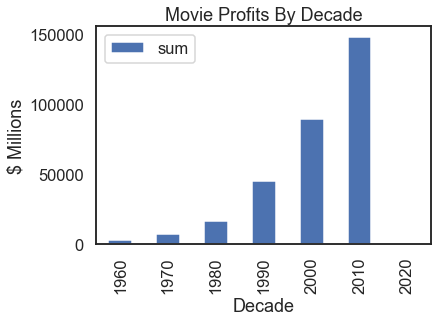

In [128]:

df_daily=bayes_df.groupby('Decade').agg(['sum']).reset_index()
df_daily.plot(x='Decade', y='Profit',kind="bar")
plt.xlabel("Decade")
plt.title("Movie Profits By Decade")
plt.ylabel("$ Millions")
plt.legend()
plt.show()


In [27]:
carft_df=bayes_df.groupby('Decade').agg(['sum']).reset_index()
list(source['Budget','sum'])

[324, 727, 4402, 20376, 53173, 66583, 425]

In [31]:
list(source.Decade.astype(str))

['1960', '1970', '1980', '1990', '2000', '2010', '2020']

In [129]:
import altair as alt
import pandas as pd

chart_df=bayes_df.groupby('Decade').agg(['sum']).reset_index()

source = pd.DataFrame({
    'Decade': list(chart_df.Decade.astype(str)),
    'Profit': list(chart_df['Profit','sum'])
})

alt.Chart(source,title="Profits By Decade").mark_bar().encode(
    x='Decade',
    y='Profit',
    color=alt.Color('Decade', scale=alt.Scale(scheme='dark2'))
).properties(width=600)

alt.Chart(...)

In [62]:
x = list(chart_df.Decade)
sum(x)/len(x)

1990.0

In [133]:
bayes_df[bayes_df['Decade']==2010].sort_values(by='Critics_Score',ascending=False)

,Title,Critics_Score,User_Score,Budget,Revenue,Profit,ROI,Profitable,Critics_Choice,Users_Pick,Award_Status,Wins,Nominations,Genres,Year,Decade,Runtime
3254,The Hate U Give,9.0,8.1,23,29,6,29,1,1,1,0,0,0,"Crime,Drama",2018,2010,133
3192,Spider-Man: Into the Spider-Verse,9.0,8.9,90,375,285,375,1,1,1,1,1,0,"Action,Adventure,Animation",2018,2010,117
2879,Coco,9.0,8.9,175,800,625,800,1,1,1,1,2,0,"Adventure,Animation,Drama",2017,2010,105
3269,Call Me by Your Name,8.9,8.4,4,41,37,41,1,1,1,1,1,3,"Drama,Romance",2017,2010,132
3144,Avengers: Endgame,8.9,8.7,356,2797,2441,2797,1,1,1,1,0,1,"Action,Adventure,Drama",2019,2010,181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3264,Slender Man,2.4,2.7,10,11,1,11,1,0,0,0,0,0,"Horror,Mystery,Thriller",2018,2010,93
2413,The Apparition,2.3,3.3,17,9,-8,9,1,0,0,0,0,0,"Horror,Thriller",2012,2010,82
2590,Vampires Suck,2.2,3.3,20,80,60,80,1,0,0,0,0,0,"Comedy,Family,Horror",2010,2010,82
1930,Jack and Jill,2.2,3.6,79,149,70,149,1,0,0,0,0,0,Comedy,2011,2010,91


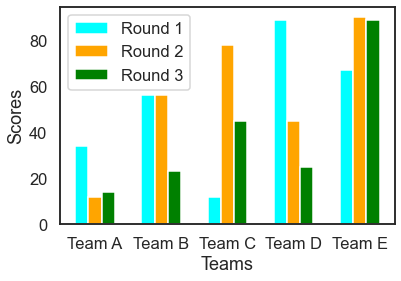

In [114]:

# importing package
import matplotlib.pyplot as plt
import numpy as np
  
# create data
x = np.arange(5)
y1 = [34, 56, 12, 89, 67]
y2 = [12, 56, 78, 45, 90]
y3 = [14, 23, 45, 25, 89]
width = 0.2
  
# plot data in grouped manner of bar type
plt.bar(x-0.2, y1, width, color='cyan')
plt.bar(x, y2, width, color='orange')
plt.bar(x+0.2, y3, width, color='green')
plt.xticks(x, ['Team A', 'Team B', 'Team C', 'Team D', 'Team E'])
plt.xlabel("Teams")
plt.ylabel("Scores")
plt.legend(["Round 1", "Round 2", "Round 3"])
plt.show()

## Comparison of Profit by Critics Flag

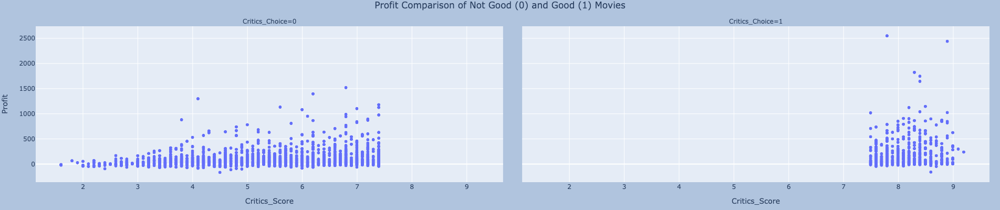

<Figure size 432x288 with 0 Axes>

In [122]:
import plotly.express as px
bayes_df
df = bayes_df
fig = px.scatter(df, x="Critics_Score", y="Profit", 
                 facet_col="Critics_Choice",
                 width=800, 
                 height=400)
                 
plt.tight_layout(h_pad=2)
fig.update_layout(
    margin=dict(l=20, r=20, t=50, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.update_layout(
    title={
        'text': "Profit Comparison of Not Good (0) and Good (1) Movies",
        'y':.99,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.show()
plt.savefig('images/profit_comp.png')

## Top Genres of Movies


In [136]:
genres_bar = px.bar(genres_top10_df, 
                    x = 'Genres', 
                    y = 'number_of_movies', 
                    title = 'Top 10 Genres in terms of number of movies',
                    text = 'number_of_movies', 
                    labels = dict(genre = 'Genre', number_of_movies = 'Number of movies'),
                    color = 'Genres',
                    width=800,height=600)
                    
genres_bar.show()

NameError: name 'genres_top10_df' is not defined

In [87]:
genres_df = bayes_df[['Genres','Title']].groupby(['Genres']).count().reset_index().rename(columns={'Title':'number_of_movies'})

#Sort them in descending order so we can extract the 10 genres with the most movies made
genres_df = genres_df.sort_values(by='number_of_movies', ascending=False)
genres_top10_df = genres_df.head(10)

In [294]:
bayes_df.describe()

,Critics_Score,User_Score,Budget,Revenue,Profit,ROI,Profitable,Critics_Choice,Users_Pick,Award_Status,Wins,Nominations,Year,Decade,Runtime
count,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000,3367.000000
mean,6.066380,6.370003,43.365013,134.840214,91.475200,134.840214,0.972973,0.264330,0.252747,0.236709,0.222453,0.615088,2003.959014,1999.248589,110.562519
std,1.677327,1.365317,45.957349,206.337613,176.673717,206.337613,0.162186,0.441041,0.434652,0.425125,0.894026,1.520425,11.838891,11.829133,19.438605
min,1.600000,2.000000,0.000000,0.000000,-166.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1960.000000,1960.000000,63.000000
25%,4.700000,5.400000,12.000000,25.000000,3.000000,25.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1998.000000,1990.000000,97.000000
50%,6.200000,6.400000,28.000000,65.000000,33.000000,65.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2007.000000,2000.000000,107.000000
75%,7.600000,7.500000,58.000000,159.000000,108.000000,159.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2013.000000,2010.000000,121.000000
max,9.200000,9.400000,380.000000,2797.000000,2550.000000,2797.000000,1.000000,1.000000,1.000000,1.000000,11.000000,11.000000,2020.000000,2020.000000,248.000000


# Show the Revenue over the Decades

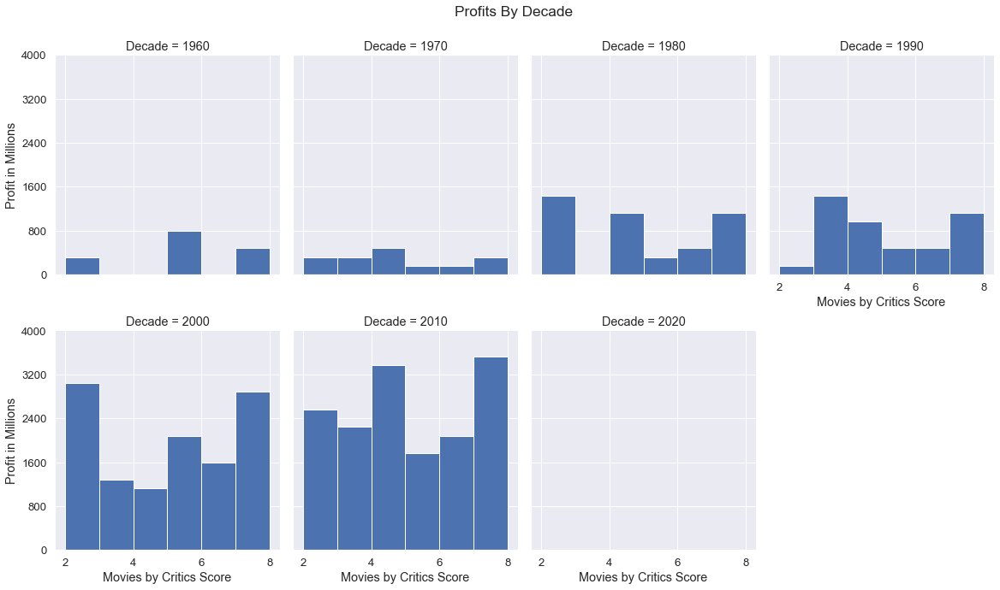

In [310]:
def plot_decade(df,group,measure):
    sns.set(font_scale=1.2)
    g = sns.FacetGrid(df, col=group, height=4,col_wrap=4 )
    g = (g.map(plt.hist, measure,bins=np.arange(2,9,1)))
    g.fig.subplots_adjust(top=0.9) 
    g.fig.suptitle('Profits By Decade')
    g.set_axis_labels("Movies by Critics Score","Profit in Millions")
    ylabels = np.linspace(0, 4000, num=6,dtype=int)
    g.set_yticklabels(ylabels)
    g.fig.set_size_inches(16,10)
    plt.savefig('images/Profits_by_decade.png', dpi=300)
plot_decade(bayes_df,'Decade','Profit')   

In [316]:
bgrouped_df = bayes_df.groupby("Decade")
maximums = bgrouped_df.max()
maximums = maximums.reset_index()
print(maximums)

   Decade                       Title  Critics_Score  User_Score  Budget  \
0    1960                        Zulu            9.0         8.8      35   
1    1970          Young Frankenstein            9.2         9.4      55   
2    1980                  Young Guns            9.0         9.1      70   
3    1990             You've Got Mail            9.1         9.4     200   
4    2000     xXx: State of the Union            8.9         9.0     270   
5    2010  xXx: Return of Xander Cage            9.0         8.9     380   
6    2020                  Underwater            8.1         8.1     175   

   Revenue  Profit   ROI  Profitable  Critics_Choice  Users_Pick  \
0      286     278   286           1               1           1   
1      470     463   470           1               1           1   
2      572     540   572           1               1           1   
3     1845    1645  1845           1               1           1   
4     2787    2550  2787           1               

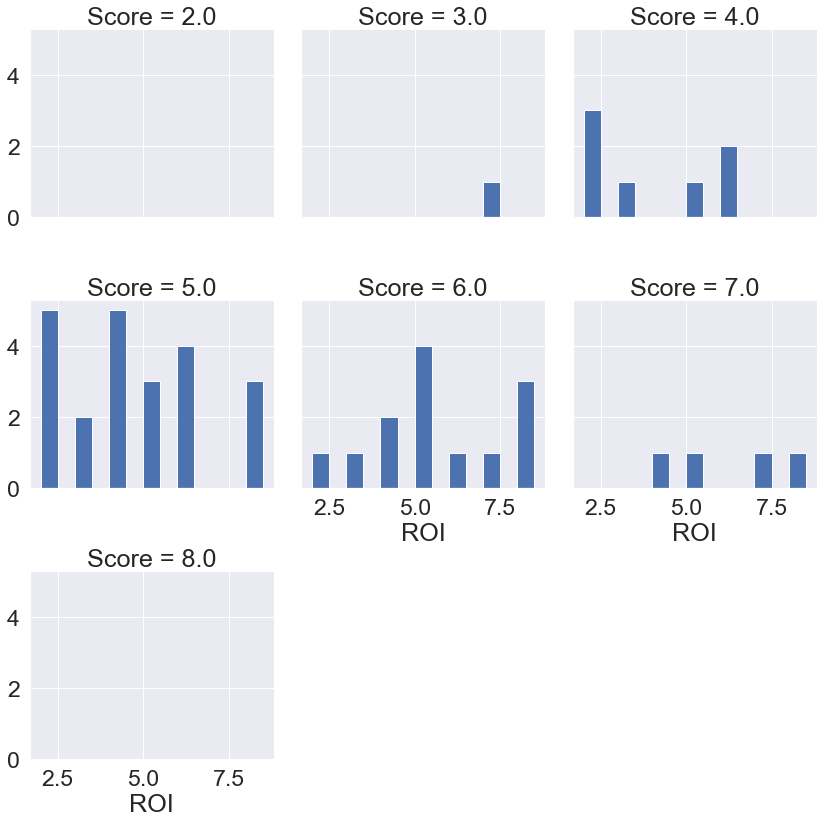

In [15]:
bayes_adj = bayes_df[bayes_df['ROI']<600]
bayes_adj['Score']=bayes_adj['Score']//1
bayes_adj.to_csv('bayes_adj', index = False, header=True)
plot_decade(bayes_adj,'Score','ROI')   

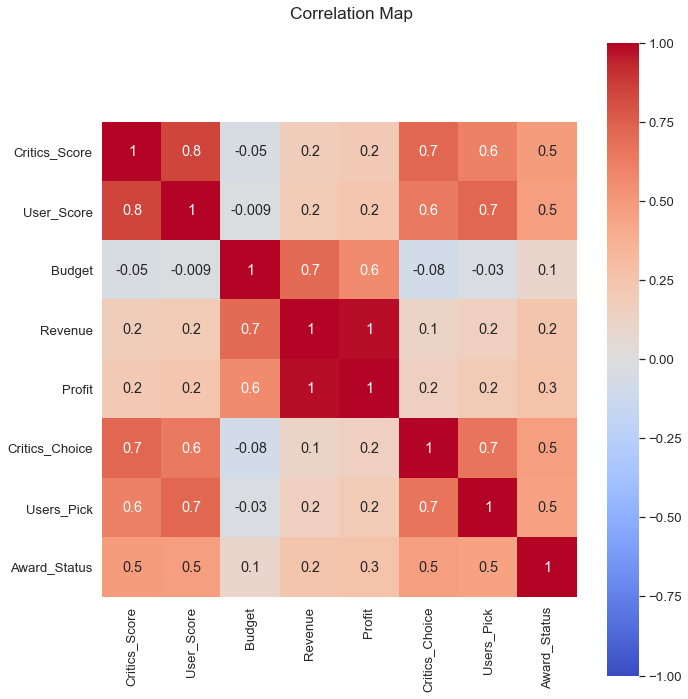

In [368]:
corr_df = bayes_df[['Critics_Score', 'User_Score', 'Budget', 'Revenue', 'Profit',
         'Critics_Choice', 'Users_Pick', 'Award_Status']]
cds = corr_df.corr()
fig, ax = plt.subplots(figsize=(10,10))   



sns.heatmap(cds, annot=True,cmap="coolwarm", 
            fmt='.1g',
            vmin=-1, vmax=1, center= 0,
            square=True,)
            #cbar_kws= {'orientation': 'horizontal'}) #use this to place temp bar at bottom
fig.subplots_adjust(top=0.95) 
fig.suptitle('Correlation Map')
plt.tight_layout()
plt.savefig('images/correlation.png', dpi=300)
plt.show()

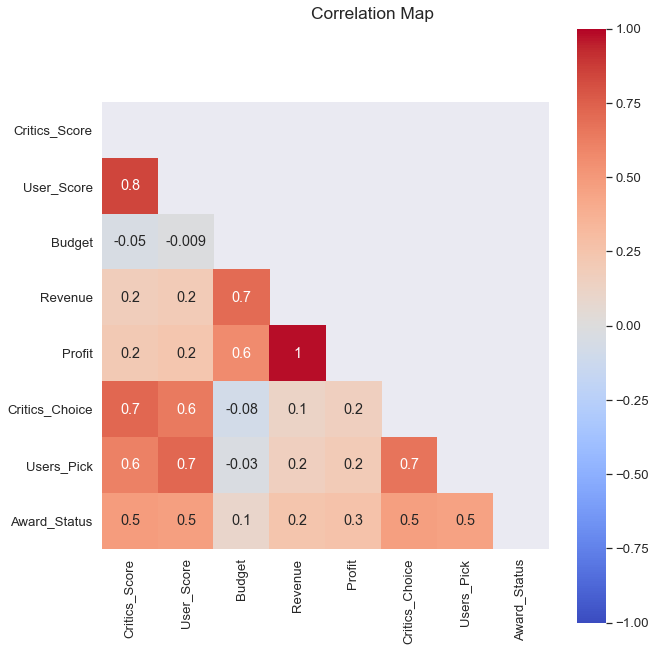

In [365]:
corr_df = bayes_df[['Critics_Score', 'User_Score', 'Budget', 'Revenue', 'Profit',
         'Critics_Choice', 'Users_Pick', 'Award_Status']]
cds = corr_df.corr()
fig, ax = plt.subplots(figsize=(10,10))   

matrix = np.triu(corr_df.corr())
sns.heatmap(corr_df.corr(), annot=True, mask=matrix,
            cmap="coolwarm", 
            fmt='.1g',
            vmin=-1, vmax=1, center= 0,
            square=True,)
fig.subplots_adjust(top=0.95) 
fig.suptitle('Correlation Map')

plt.savefig('images/correlation.png', dpi=300)
plt.show()

## Another Correlation MAP

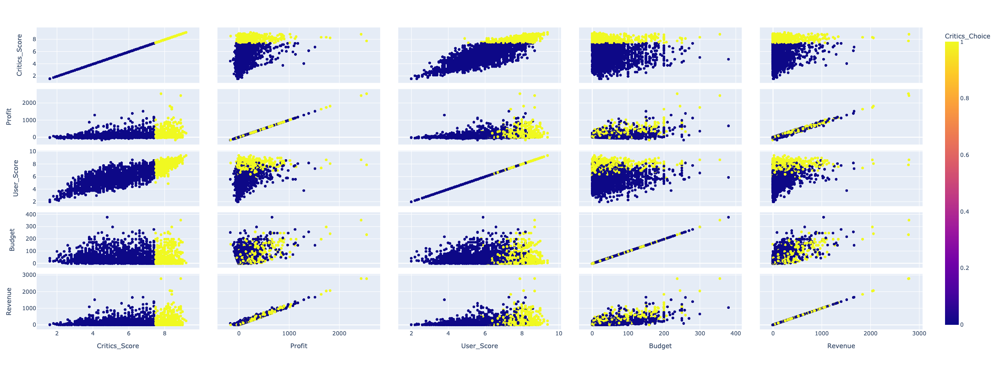

<Figure size 432x288 with 0 Axes>

In [335]:

fig = px.scatter_matrix(bayes_df,
    dimensions=["Critics_Score", "Profit", "User_Score", 'Budget','Revenue'],
    color="Critics_Choice", width=800, height=800)
fig.show()


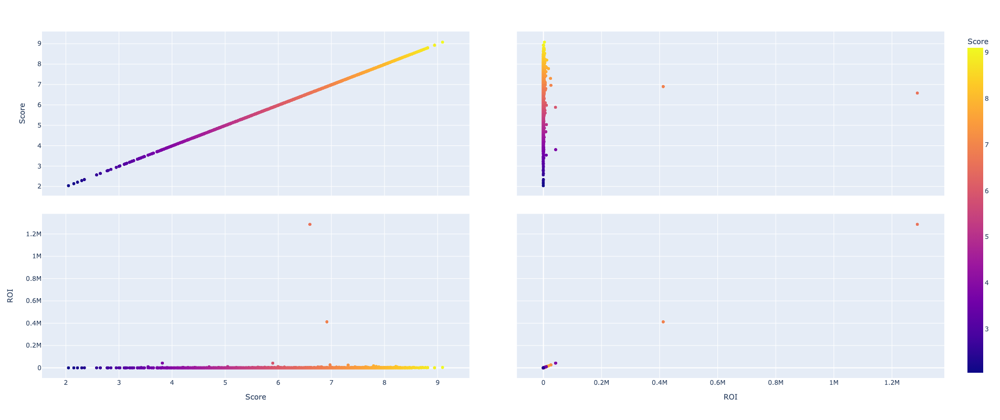

In [17]:
# Correlation Matrix all data

fig = px.scatter_matrix(bayes_df,
    dimensions=["Score", "ROI"],
    color="Score", width=800, height=800)
fig.show()

In [139]:
from scipy import stats
import matplotlib.pyplot as plt
import numpy as np
%matplotlib notebook

In [140]:
# random variable generation for gamma distribution

def generate_gamma_dist(shape):
    dist_gamma = sorted(stats.gamma.rvs(shape, loc=0, scale=1000, size=5000))
    shape, loc, scale = stats.gamma.fit(dist_gamma, loc=0)
    pdf_gamma = stats.gamma.pdf(dist_gamma, shape, loc, scale)
    return dist_gamma, pdf_gamma

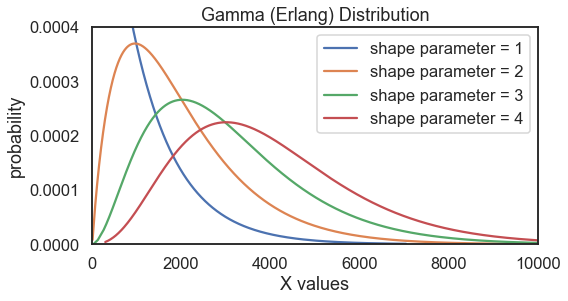

In [141]:
# visualize
%matplotlib inline
fig, ax = plt.subplots(figsize=(8, 4))
for i in range(1, 5):
    x, y = generate_gamma_dist(i)
    ax.plot(x, y, label='shape parameter = %s' % i)
    
ax.set_xlabel('X values')
ax.set_ylabel('probability')
ax.set_ylim(0, 0.0004)
ax.set_xlim(0, 10000)
ax.set_title('Gamma (Erlang) Distribution')
ax.legend();

In [142]:
bayes_adj2 = bayes_adj.sort_values(by="Good",ascending=False)
fig = px.scatter_matrix(bayes_adj2,
    dimensions=["Score", "Genres", "Runtime",],
    color="Year", width=800, height=800)
fig.show()

NameError: name 'bayes_adj' is not defined

In [7]:
#Presentation

import plotly.express as px
df = years_by_genre
fig = px.box(df, x="Good", y="Success")
fig.show()

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['Title', 'Score', 'Budget', 'Revenue', 'ROI', 'Year', 'Runtime', 'Genres', 'Wins', 'Nominations', 'Decade'] but received: Good

## For Hypothesis Testing and Statistical Analysis:
- A <b>Good movie </b>is defined as having a score > 70.00 or having at least 1 Oscar Win or Oscar Nomination.
    - this is flagged as Good == 1 in the dataframe
- A <b>Financially successful</b> movie has Revenue = 3 * Budget
    - this is flagged as Success  == 1
    
## For Bayes:    
H0 = Good Movies are financially successful.<br>
HA = Good Movies are not financially successful.




In [133]:
import pandas as pd
import numpy as np
from scipy import stats
from matplotlib import pyplot as plt
def plot_beta(alpha, beta, ax=None, title="", xlabel="",ylabel="", label=""):
    '''plot the Beta distribution PDF with parameters alpha and beta
    Args
    ----
        alpha (positive number)
        beta (positive number)
    '''
    # Build a beta distribtuion scipy object.
    dist = stats.beta(alpha, beta)

    # The support (always this for the beta dist).
    x = np.linspace(0.0, 1.0, 301)

    # The probability density at each sample support value.
    y = dist.pdf(x)

    # Plot it all.
    if ax is None:
        fig, ax = plt.subplots()
    xticks=[0.0, 0.5, 1.0]
    lines = ax.plot(x, y, label=label)
    ax.fill_between(x, y, alpha=0.2, color=lines[0].get_c())
    if title: 
        ax.set_title(title)
    else:
        ax.set_title(f'Beta distribution alpha={alpha}, beta={beta} ')
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.get_yaxis().set_ticks([])
    #ax.get_yaxis().set_ticks([np.max(y)])
    ax.get_xaxis().set_ticks(xticks)
    ax.set_ylim(0.0, min(np.max(y)*1.2,100))

def estimate_beta_params(data):
    """Estimate the alpha & beta parameters of beta distribution by fitting Beta distribution to the conversion data 
    Args
    ----
        data: a list of 0 (miss) or 1 (convert) or a 1-D np.array
    return
    ------
        Alpha: number of successes +1
        Beta: Number of failures +1
        Mean: "success" rate
        num_conversions & total_visitors: used to make labels on graphs 
    
    """
    #array of website conversions... zeros and ones (convert or didnt convert)
    website_samples = np.array(data)
    
    #total number of conversions
    num_conversions = website_samples.sum()
    #total number of datapoints
    total_visitors = len(website_samples)
    
    #plus one to set a and beta as uniform priors...try other numbers to see the changes
    alpha = num_conversions + 1
    beta = (total_visitors - num_conversions) + 1
    
    #mean number of conversions... aka conversion rate
    mean = 1 * num_conversions / total_visitors

    return alpha, beta, mean, num_conversions, total_visitors

def plot_beta_from_data(data, ax=None, label=None):
    """First estimate the Beta distribution parameters from data and then plot the Beta PDF distribution
    Args
    ----
        data: a list of 0 (miss) or 1 (convert)
    
    """
    alpha, beta, mean, num_conversions, total_visitors = estimate_beta_params(data)
    title =  r"Successful {}/{}".format(num_conversions, total_visitors)
    plot_beta(alpha, beta, ax=ax, title=title, xlabel="Success Rate", ylabel="Probability Density", label=label)


In [125]:
bayes_df = pd.read_csv('data/movie_aggregate.csv')

## Setting up data for Hypothesis Test

### Hypothesis 1

<b>H<sub>0</sub> : </b>Good movies have a high probability of financial success in the box office.<br>
<b>H<sub>A</sub> : </b>Good movies have a normal probability of financial success in the box office.

In [ ]:
df_good = bayes_adj[bayes_adj['Good']==1] #742 records -- Movies with Score>= 7.5 
df_bad = bayes_adj[bayes_adj['Good']==0] #2042 records -- Movies with Score < 7.5 

data1 = df_good.sample(n=300)['Success']
data2 = df_bad.sample(n=300)['Success']

In [ ]:
# Prep data for test


In [194]:


df_success = bayes_adj[bayes_adj['Success']==1] # 760 records -- movies with ROI > 3xBudget
df_nsuccess = bayes_adj[bayes_adj['Success']==0] # 2024 records -- movies with ROI > 3xBudget

data3 = df_success.sample(n=300)['Good']
data4 = df_nsuccess.sample(n=300)['Good']

In [193]:
df_bad.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2042 entries, 33 to 3395
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Title        2042 non-null   object 
 1   Score        2042 non-null   float64
 2   Budget       2042 non-null   int64  
 3   Revenue      2042 non-null   int64  
 4   ROI          2042 non-null   int64  
 5   Year         2042 non-null   int64  
 6   Runtime      2042 non-null   int64  
 7   Genres       2042 non-null   object 
 8   Wins         2042 non-null   int64  
 9   Nominations  2042 non-null   int64  
 10  Decade       2042 non-null   int64  
 11  Success      2042 non-null   int64  
 12  Good         2042 non-null   int64  
dtypes: float64(1), int64(10), object(2)
memory usage: 223.3+ KB


## Perform a Mann-Whitney U Test

In [124]:
def MannWhitneyU(d1,d2):
    m_results = stats.mannwhitneyu(data1, data2, alternative = 'two-sided')
    print("Mann-Whitney U Test Results:")
    if m_results[1] > 0.05:
        print(f'p-value is {m_results[1]}, which is greater than 0.05, therefore we reject the null hypothesis')
    else:
        print(f'p-value is {m_results[1]}, which is less than 0.05, therefore we do not reject the null hypothesis ')
    #p-value>0.05 fail to reject null hypothesis


MannWhitneyU(data1,data2)

NameError: name 'data1' is not defined

In [123]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Scatter(x=support, y=bad_pdf, name="Rating Score < 7.5"),
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=support, y=good_pdf, name="Rating Score > 7.5"),
    secondary_y=True,
)


# Add figure title
fig.update_layout(
    title={
        'text' : 'Good vs. Not Good Movies',
        'y':0.9,
        'x':0.5,
        'xanchor': 'right',
        'yanchor': 'top'},
    width=800, 
    height=500)
    

# Set x-axis title
fig.update_xaxes(title_text="ROI - Financial Success")

# Set y-axes titles
fig.update_yaxes(title_text="<b>Good</b> movies", secondary_y=False)
fig.update_yaxes(title_text="<b>Not Good</b> movies", secondary_y=True)

fig.show()

NameError: name 'support' is not defined

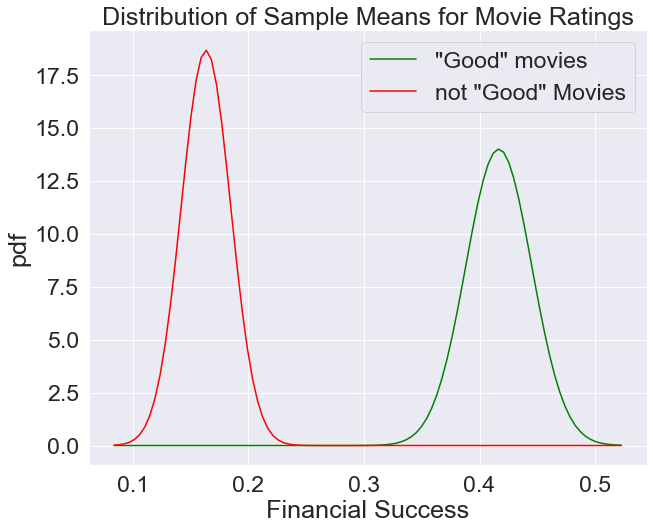

In [248]:
fig,ax = plt.subplots(figsize=(10,8))

good_dist = stats.norm(data1.mean(), data1.std()/np.sqrt(len(data1)))
bad_dist = stats.norm(data2.mean(), data2.std()/np.sqrt(len(data2)))

support = np.linspace(bad_dist.ppf(0.0001), good_dist.ppf(0.9999), 100)
good_pdf = good_dist.pdf(support)
bad_pdf = bad_dist.pdf(support)

ax.plot(support, good_pdf, color='green', label='"Good" movies')
ax.plot(support, bad_pdf, color='red', label='not "Good" Movies')
ax.legend()
ax.set_ylabel("pdf")
ax.set_xlabel('Financial Success')
ax.set_title("Distribution of Sample Means for Age")
ax.figure.savefig('images/Success.png', bbox_inches='tight');

In [203]:
# use statistical analysis to determine the likelihood that good movies have a high probability of being profitable
#plot_beta_from_data(data1)
#plot_beta_from_data(data2)
#plot_beta_from_data(data3)
#plot_beta_from_data(data4)

In [230]:
def compare_AB_conversion_rate(site_A_data, site_B_data, n=None):
    """compare the conversion rate of 2 different solutions A & B
    Args
    ----
        site_A_data (1-D np.array of shape (N,))
        site_B_data (1-D np.array of shape (N,))
        n (int): use a sub list of samples[:n]
    Return
    ------
        a plot comparing the conversion rate of site A and that of site B.
    """
    ax = plt.subplot()
    if n is None:
        n = min(len(site_A_data), len(site_A_data))
    site_A_samples = site_A_data[:n]
    site_B_samples = site_B_data[:n]
    plot_beta_from_data(site_A_samples, ax, label="Site A")
    plot_beta_from_data(site_B_samples, ax, label="Site B")
    plt.title(f'Comparing {n} Movies')
    plt.show()
    

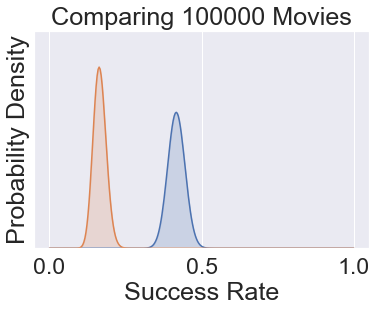

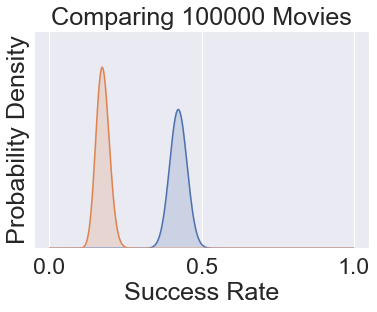

In [232]:
compare_AB_conversion_rate(data1,data2, n=100000)
compare_AB_conversion_rate(data3,data4, n=100000)

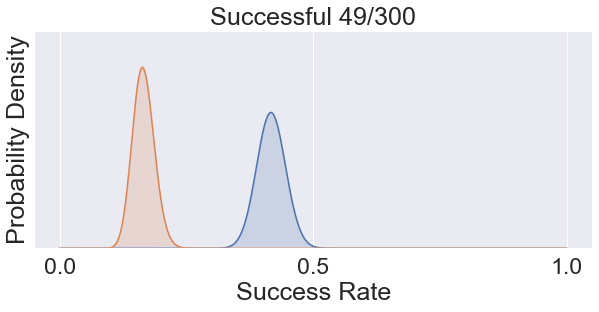

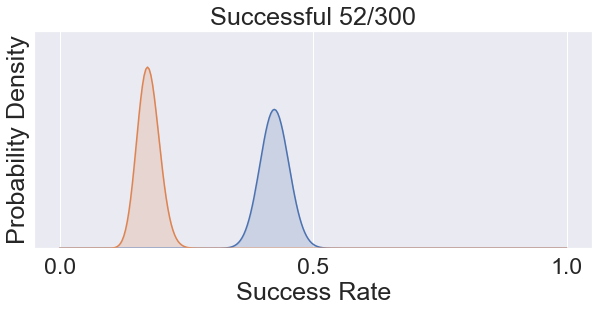

In [199]:
fig, ax = plt.subplots(1, 1, figsize=(10, 4))

plot_beta_from_data(data1, ax=ax)
plot_beta_from_data(data2, ax=ax)


fig, ax = plt.subplots(1, 1, figsize=(10, 4))

plot_beta_from_data(data3, ax=ax)
plot_beta_from_data(data4, ax=ax)

In [200]:
alpha, beta = estimate_beta_params(data1)[:2]
alpha,beta

(126, 176)

In [201]:
num_simulations = 1000

#Let's just grab our Alpha and betas from site_A
alpha, beta = estimate_beta_params(data1)[:2]
print(f'Movies with 7.5 score and/or have an oscar nod, alpha and beta {alpha, beta}')
#Set up first distribution
dist_A = stats.beta(alpha, beta)


#Same steps for beta dist
alpha, beta = estimate_beta_params(data2)[:2]
print(f'Movies with below 7.5 score and no oscar nod, alpha and beta {alpha, beta}')
dist_B = stats.beta(alpha, beta)

#randomly sample 100_000 data points from each distribution
simulated_A = dist_A.rvs(num_simulations)

simulated_B = dist_B.rvs(num_simulations)


print(f'Given the data, a "good" movie is {(simulated_A > simulated_B).mean()*100}% likely to have a high probability of it being financially successful. ')

Movies with 7.5 score and/or have an oscar nod, alpha and beta (126, 176)
Movies with below 7.5 score and no oscar nod, alpha and beta (50, 252)
Given the data, a "good" movie is 100.0% likely to have a high probability of it being financially successful. 


In [202]:
num_simulations = 1000

#Let's just grab our Alpha and betas from site_A
alpha, beta = estimate_beta_params(data3)[:2]
print(f'Movies with 300%+ ROI, alpha and beta {alpha, beta}')
#Set up first distribution
dist_A = stats.beta(alpha, beta)


#Same steps for beta dist
alpha, beta = estimate_beta_params(data4)[:2]
print(f'Movies with less than 300% ROI, alpha and beta {alpha, beta}')
dist_B = stats.beta(alpha, beta)

#randomly sample 100_000 data points from each distribution
simulated_A = dist_A.rvs(num_simulations)

simulated_B = dist_B.rvs(num_simulations)


print(f'Given the data, a successful movie is {(simulated_A > simulated_B).mean()*100}% likely to have a high probability of it being good. ')

Movies with 300%+ ROI, alpha and beta (128, 174)
Movies with less than 300% ROI, alpha and beta (53, 249)
Given the data, a successful movie is 100.0% likely to have a high probability of it being good. 


In [144]:
bayes_df.sort_values(by='Profit',ascending=False).head(10)

,Title,Critics_Score,User_Score,Budget,Revenue,Profit,ROI,Profitable,Critics_Choice,Users_Pick,Award_Status,Wins,Nominations,Genres,Year,Decade,Runtime
1870,Avatar,7.8,7.9,237,2787,2550,2787,1,1,1,1,3,6,"Action,Adventure,Fantasy",2009,2000,162
3144,Avengers: Endgame,8.9,8.7,356,2797,2441,2797,1,1,1,1,0,1,"Action,Adventure,Drama",2019,2010,181
2915,Star Wars: The Force Awakens,8.3,8.1,245,2068,1823,2068,1,1,1,1,0,5,"Action,Adventure,Sci-Fi",2015,2010,136
3143,Avengers: Infinity War,8.4,8.7,300,2046,1746,2046,1,1,1,1,0,1,"Action,Adventure,Sci-Fi",2018,2010,149
805,Titanic,8.4,7.4,200,1845,1645,1845,1,1,0,1,11,3,"Drama,Romance",1997,1990,194
1447,Jurassic World,6.8,7.3,150,1671,1521,1671,1,0,0,0,0,0,"Action,Adventure,Sci-Fi",2015,2010,124
3285,The Lion King,6.2,8.2,260,1656,1396,1656,1,0,1,1,0,3,"Adventure,Animation,Drama",2019,2010,118
1966,The Avengers,4.1,3.8,220,1519,1299,1519,1,0,0,0,0,0,"Action,Adventure,Sci-Fi",2012,2010,143
3178,Frozen II,7.4,8.1,150,1330,1180,1330,1,0,1,1,0,1,"Adventure,Animation,Comedy",2019,2010,104
2678,Black Panther,8.5,7.6,200,1346,1146,1346,1,1,1,1,3,4,"Action,Adventure,Sci-Fi",2018,2010,134


In [145]:
bayes_df.sort_values(by='User_Score',ascending=False).head(10)

,Title,Critics_Score,User_Score,Budget,Revenue,Profit,ROI,Profitable,Critics_Choice,Users_Pick,Award_Status,Wins,Nominations,Genres,Year,Decade,Runtime
76,The Godfather,9.2,9.4,6,245,239,245,1,1,1,1,3,8,"Crime,Drama",1972,1970,175
616,The Shawshank Redemption,8.9,9.4,25,28,3,28,1,1,1,1,0,7,Drama,1994,1990,142
613,Pulp Fiction,8.8,9.2,8,214,206,214,1,1,1,1,1,6,"Crime,Drama",1994,1990,154
581,Schindler's List,9.1,9.2,22,321,299,321,1,1,1,1,7,5,"Biography,Drama,History",1993,1990,195
160,The Empire Strikes Back,8.9,9.1,18,538,520,538,1,1,1,1,2,2,"Action,Adventure,Fantasy",1980,1980,124
105,One Flew Over the Cuckoo's Nest,8.9,9.1,3,108,105,108,1,1,1,0,0,0,Drama,1975,1970,133
910,Fight Club,8.2,9.1,63,100,37,100,1,1,1,1,0,1,Drama,1999,1990,139
816,American History X,8.4,9.0,20,23,3,23,1,1,1,1,0,1,Drama,1998,1990,119
982,The Lord of the Rings: The Two Towers,8.9,9.0,79,926,847,926,1,1,1,1,2,4,"Action,Adventure,Drama",2002,2000,179
1144,The Pianist,8.9,9.0,35,120,85,120,1,1,1,1,3,4,"Biography,Drama,Music",2002,2000,150


In [146]:
bayes_df.sort_values(by='Critics_Score',ascending=False).head(10)

,Title,Critics_Score,User_Score,Budget,Revenue,Profit,ROI,Profitable,Critics_Choice,Users_Pick,Award_Status,Wins,Nominations,Genres,Year,Decade,Runtime
76,The Godfather,9.2,9.4,6,245,239,245,1,1,1,1,3,8,"Crime,Drama",1972,1970,175
581,Schindler's List,9.1,9.2,22,321,299,321,1,1,1,1,7,5,"Biography,Drama,History",1993,1990,195
141,Alien,9.0,8.8,11,104,93,104,1,1,1,1,1,1,"Horror,Sci-Fi",1979,1970,117
2879,Coco,9.0,8.9,175,800,625,800,1,1,1,1,2,0,"Adventure,Animation,Drama",2017,2010,105
4,Psycho,9.0,8.2,0,32,32,32,1,1,1,1,0,4,"Horror,Mystery,Thriller",1960,1960,109
677,Toy Story,9.0,8.6,30,373,343,373,1,1,1,1,0,3,"Adventure,Animation,Comedy",1995,1990,81
265,Back to the Future,9.0,8.9,19,381,362,381,1,1,1,1,1,3,"Adventure,Comedy,Sci-Fi",1985,1980,116
3192,Spider-Man: Into the Spider-Verse,9.0,8.9,90,375,285,375,1,1,1,1,1,0,"Action,Adventure,Animation",2018,2010,117
142,Apocalypse Now,9.0,8.9,31,150,119,150,1,1,1,1,2,6,"Drama,Mystery,War",1979,1970,153
633,Before Sunrise,9.0,8.6,2,5,3,5,1,1,1,0,0,0,"Drama,Romance",1995,1990,101
